In [1]:
from ucimlrepo import fetch_ucirepo

In [2]:
# fetch dataset 
rice = fetch_ucirepo(id=545)

In [3]:
from logistic_regression import LogisticRegression
model = LogisticRegression(rice["data"]["original"])

## Feature distributions before normalization
We have rendered the distribution graphs of the features in the folder feature_graphs with high resolution. You can check them below or also render them by calling the plot_feature method of 'model'.

In [4]:
# model.plot_feature(0)
# model.plot_feature(1)
# model.plot_feature(2)
# model.plot_feature(3)
# model.plot_feature(4)
# model.plot_feature(5)
# model.plot_feature(6)

### Distribution of feature 0 (Area)
![Distribution of feature 0 (Area)](feature_graphs/feature0_distribution.png)
### Distribution of feature 1 (Perimeter)
![Distribution of feature 1 (Perimeter)](feature_graphs/feature1_distribution.png)
### Distribution of feature 2 (Major_Axis_Length)
![Distribution of feature 2 (Major_Axis_Length)](feature_graphs/feature2_distribution.png)
### Distribution of feature 3 (Minor_Axis_Length)
![Distribution of feature 3 (Minor_Axis_Length)](feature_graphs/feature3_distribution.png)
### Distribution of feature 4 (Eccentricity)
![Distribution of feature 4 (Eccentricity)](feature_graphs/feature4_distribution.png)
### Distribution of feature 5 (Convex_Area)
![Distribution of feature 5 (Convex_Area)](feature_graphs/feature5_distribution.png)
### Distribution of feature 6 (Extent)
![Distribution of feature 6 (Extent)](feature_graphs/feature6_distribution.png)

## Clipping
We decided to clip the outliers from 0th, 3rd, 4th, and 5th features (area, minor_axis_length, eccentricity, and convex_area).

In [5]:
model.clip_feature(0, 8459, 17663)
model.clip_feature(3, 67.7, 104)
model.clip_feature(4, 0.825, 0.935)
model.clip_feature(5, 8519, 17961)

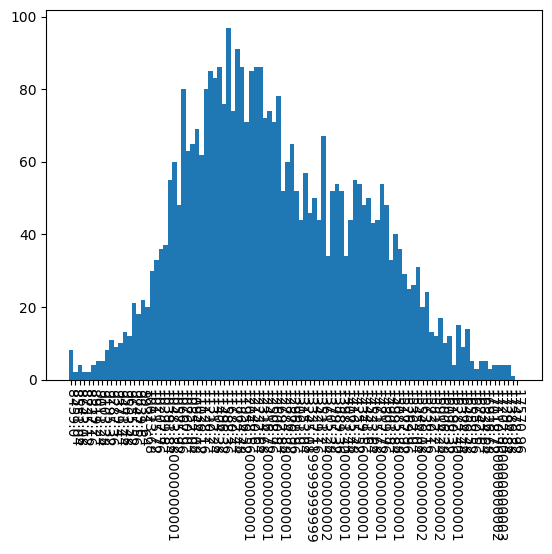

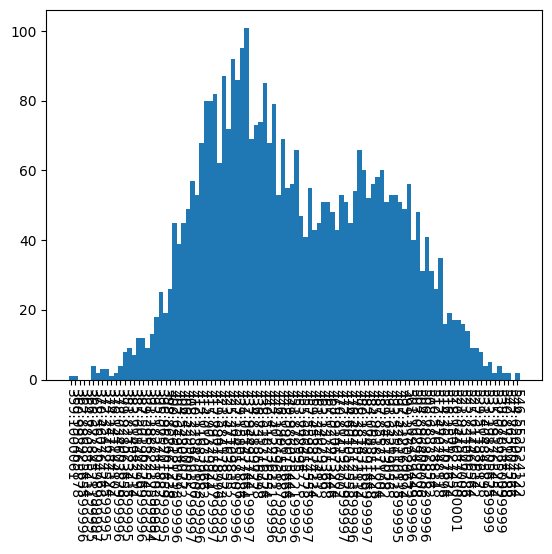

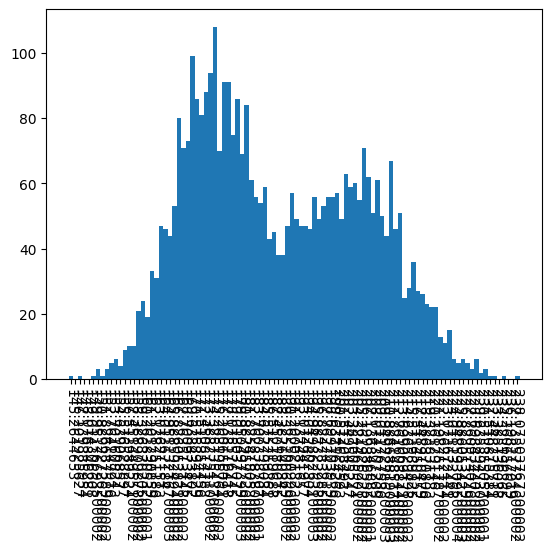

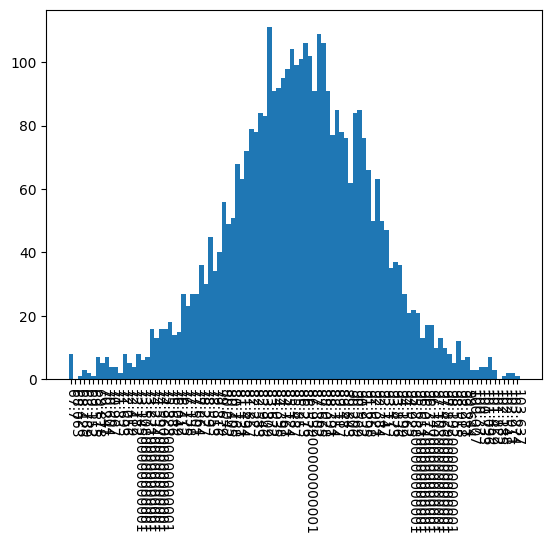

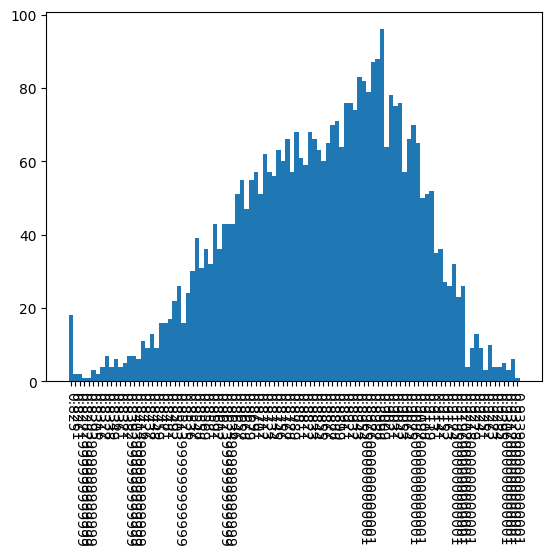

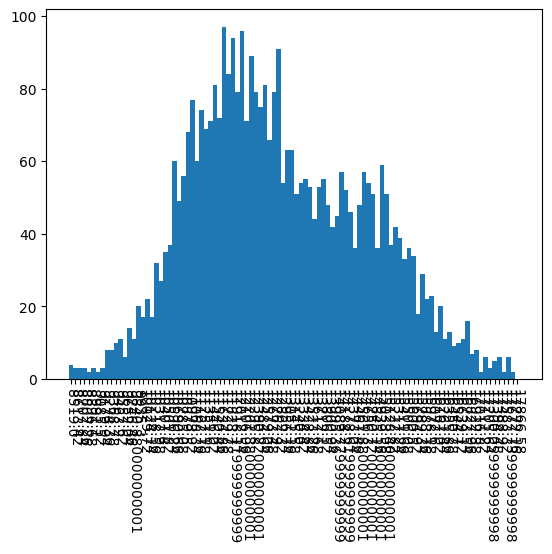

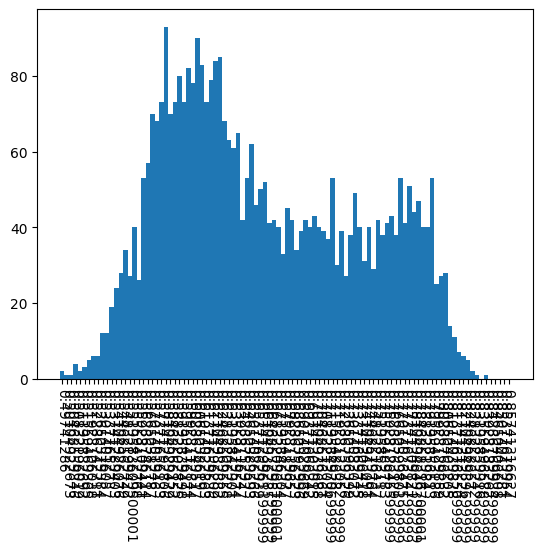

In [6]:
model.plot_feature(0)
model.plot_feature(1)
model.plot_feature(2)
model.plot_feature(3)
model.plot_feature(4)
model.plot_feature(5)
model.plot_feature(6)

## Scaling
Now, we will scale all features between 0 and 1.

In [7]:
model.scale_features()

## Data split

In [8]:
model.split_data(0.8)

## Training

Let's train now

In [9]:
from datetime import datetime

In [10]:
start = datetime.now()
model.GD(0.05, 40000)
end = datetime.now()
non_reg_gd_duration = (end-start).total_seconds()
print("Time elapsed in seconds: ", (end-start).total_seconds())

Iteration:  0
	Training accuracy:  0.19619422572178477
	Test accuracy:  0.23622047244094488
Iteration:  1
	Training accuracy:  0.42158792650918636
	Test accuracy:  0.452755905511811
Iteration:  2
	Training accuracy:  0.42158792650918636
	Test accuracy:  0.452755905511811
Iteration:  3
	Training accuracy:  0.42158792650918636
	Test accuracy:  0.452755905511811
Iteration:  4
	Training accuracy:  0.422244094488189
	Test accuracy:  0.452755905511811
Iteration:  5
	Training accuracy:  0.42355643044619423
	Test accuracy:  0.4540682414698163
Iteration:  6
	Training accuracy:  0.4258530183727034
	Test accuracy:  0.4566929133858268
Iteration:  7
	Training accuracy:  0.43208661417322836
	Test accuracy:  0.46062992125984253
Iteration:  8
	Training accuracy:  0.4340551181102362
	Test accuracy:  0.46062992125984253
Iteration:  9
	Training accuracy:  0.4389763779527559
	Test accuracy:  0.4645669291338583
Iteration:  10
	Training accuracy:  0.443241469816273
	Test accuracy:  0.4645669291338583
Iterat

In [11]:
start = datetime.now()
model.SGD(0.05, 60)
end = datetime.now()
non_reg_sgd_duration = (end-start).total_seconds()
print("Time elapsed in seconds: ", (end-start).total_seconds())

Epoch:  0
	Training accuracy:  0.8280839895013123
	Test accuracy:  0.8202099737532809
Epoch:  1
	Training accuracy:  0.8582677165354331
	Test accuracy:  0.8674540682414699
Epoch:  2
	Training accuracy:  0.8809055118110236
	Test accuracy:  0.884514435695538
Epoch:  3
	Training accuracy:  0.8956692913385826
	Test accuracy:  0.9028871391076115
Epoch:  4
	Training accuracy:  0.9045275590551181
	Test accuracy:  0.910761154855643
Epoch:  5
	Training accuracy:  0.9114173228346457
	Test accuracy:  0.9173228346456693
Epoch:  6
	Training accuracy:  0.9137139107611548
	Test accuracy:  0.9173228346456693
Epoch:  7
	Training accuracy:  0.9163385826771654
	Test accuracy:  0.9199475065616798
Epoch:  8
	Training accuracy:  0.9166666666666666
	Test accuracy:  0.9199475065616798
Epoch:  9
	Training accuracy:  0.9186351706036745
	Test accuracy:  0.9186351706036745
Epoch:  10
	Training accuracy:  0.9199475065616798
	Test accuracy:  0.9212598425196851
Epoch:  11
	Training accuracy:  0.9209317585301837
	Tes

## 5-fold Cross Validation for Finding Regularization Parameter

Gradient descent

In [12]:
gd_best_lambda, gd_mean_accuracies = model.find_best_lambda(5, [-3, -4, -5, -6], 0.05, 40000)

Stochastic Gradient Descent

In [13]:
sgd_best_lambda, sgd_mean_accuracies = model.find_best_lambda(5, [-3, -4, -5, -6], 0.05, 60, is_stochastic=True)

In [14]:
gd_best_lambda, gd_mean_accuracies, sgd_best_lambda, sgd_mean_accuracies

(-5,
 [0.9137155778082855,
  0.9183100487227112,
  0.9206067458074241,
  0.9206067458074241],
 -5,
 [0.6043468195644566,
  0.9268437912191445,
  0.9278273977765217,
  0.9278273977765217])

## Training with regularization

In [15]:
start = datetime.now()
model.GD(0.05, 40000, lambda_power=gd_best_lambda)
end = datetime.now()
reg_gd_duration = (end-start).total_seconds()
print("Time elapsed in seconds: ", (end-start).total_seconds())

Iteration:  0
	Training accuracy:  0.44258530183727035
	Test accuracy:  0.4658792650918635
Iteration:  1
	Training accuracy:  0.442257217847769
	Test accuracy:  0.4645669291338583
Iteration:  2
	Training accuracy:  0.44586614173228345
	Test accuracy:  0.46981627296587924
Iteration:  3
	Training accuracy:  0.44849081364829396
	Test accuracy:  0.473753280839895
Iteration:  4
	Training accuracy:  0.45144356955380577
	Test accuracy:  0.4763779527559055
Iteration:  5
	Training accuracy:  0.4543963254593176
	Test accuracy:  0.48031496062992124
Iteration:  6
	Training accuracy:  0.458005249343832
	Test accuracy:  0.484251968503937
Iteration:  7
	Training accuracy:  0.4609580052493438
	Test accuracy:  0.484251968503937
Iteration:  8
	Training accuracy:  0.46391076115485563
	Test accuracy:  0.48556430446194226
Iteration:  9
	Training accuracy:  0.4678477690288714
	Test accuracy:  0.489501312335958
Iteration:  10
	Training accuracy:  0.47276902887139105
	Test accuracy:  0.489501312335958
Iterati

In [16]:
start = datetime.now()
model.SGD(0.05, 60, lambda_power=sgd_best_lambda)
end = datetime.now()
reg_sgd_duration = (end-start).total_seconds()
print("Time elapsed in seconds: ", (end-start).total_seconds())

Epoch:  0
	Training accuracy:  0.8280839895013123
	Test accuracy:  0.821522309711286
Epoch:  1
	Training accuracy:  0.8582677165354331
	Test accuracy:  0.8674540682414699
Epoch:  2
	Training accuracy:  0.8809055118110236
	Test accuracy:  0.884514435695538
Epoch:  3
	Training accuracy:  0.8956692913385826
	Test accuracy:  0.9028871391076115
Epoch:  4
	Training accuracy:  0.9045275590551181
	Test accuracy:  0.9094488188976378
Epoch:  5
	Training accuracy:  0.9114173228346457
	Test accuracy:  0.9173228346456693
Epoch:  6
	Training accuracy:  0.9137139107611548
	Test accuracy:  0.916010498687664
Epoch:  7
	Training accuracy:  0.9163385826771654
	Test accuracy:  0.9199475065616798
Epoch:  8
	Training accuracy:  0.916994750656168
	Test accuracy:  0.9199475065616798
Epoch:  9
	Training accuracy:  0.9189632545931758
	Test accuracy:  0.9199475065616798
Epoch:  10
	Training accuracy:  0.9199475065616798
	Test accuracy:  0.9199475065616798
Epoch:  11
	Training accuracy:  0.9209317585301837
	Test 

## Accuracy table

| Training Accuracies | GD | SGD |
|:---:|:---:|:---:|
| *Non-regularized*| 92.2% | 91.9% |
| *Regularized*| 92.2% | 92.0% |


| Test Accuracies | GD | SGD |
|:---:|:---:|:---:|
| *Non-regularized*| 93.4% | 93.5% |
| *Regularized*| 93.4% | 93.4% |


## Time Comparison

In [17]:
non_reg_gd_duration, non_reg_sgd_duration, reg_gd_duration, reg_sgd_duration

(11.693541, 4.707063, 16.699408, 5.145004)

| Training Durations | GD | SGD |
|:---:|:---:|:---:|
| *Non-regularized*| 11.69 sec | 4.70 sec |
| *Regularized*| 16.70 sec | 5.14 sec |
